The following code uses Digital Signal Processing (DSP) techniques to clean a noisy audio file captured from NASA’s Perseverance Rover on Mars.

### Libraries for Plotting

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

### Library for Playing Audio

In [ ]:
from IPython.display import Audio

### Allow Access to Google Drive for Audio File

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Read Audio File and Plot Waveform

Text(0, 0.5, 'Magnitude')

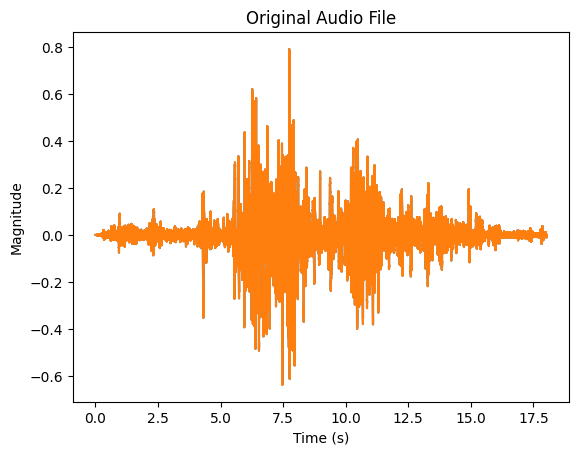

In [ ]:
#Import libraries for reading audio file
import librosa
import soundfile as sf

x, fs = sf.read('/content/drive/MyDrive/Colab Notebooks/dsp/CW/Sounds-of-Mars_first-sounds-raw.wav') #Acquire audio and its frequency from google drive
duration = librosa.get_duration(path='/content/drive/MyDrive/Colab Notebooks/dsp/CW/Sounds-of-Mars_first-sounds-raw.wav') #Acquire the audio duration
t = np.arange(0, duration-0.00001, step=1. / fs) #Create time scale for graph

#Plot signal magnitude against time
plt.plot(t, x)
plt.title('Original Audio File')
plt.xlabel('Time (s)')
plt.ylabel('Magnitude')

### Play Original Audio File

In [ ]:
Audio(x.T, rate=fs) #Play audio at sampling frequency

### Analysis of Audio File

`np.fft.fft` is used to implement the Fast Fourier Transform (FFT), an efficient algorithm for computing the Discrete Fourier Transform (DFT).


Text(0, 0.5, 'Magnitude')

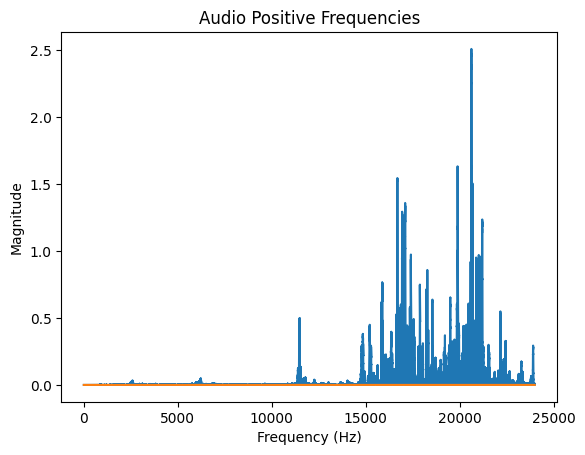

In [ ]:
#Calculate the FFT
X = np.fft.fft(x)
X_pow = np.abs(X) ** 2

N = len(x)
f_pos = np.arange(0, fs / 2, step=fs / N) #Determine frequencies

#Plot the audio file's positive frequencies
plt.plot(f_pos, X_pow[:(N // 2)])
plt.title('Audio Positive Frequencies')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')

Text(0, 0.5, 'Magnitude')

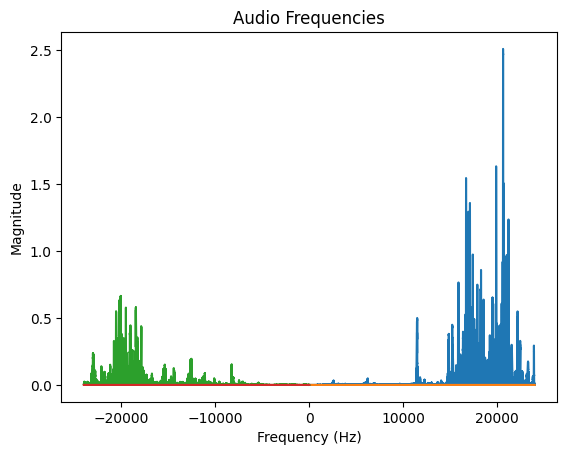

In [ ]:
#Plot positive frequencies
f_pos = np.arange(0, fs / 2, step=fs / N)
plt.plot(f_pos, X_pow[:(N // 2)])

# Plot negative frequencies
f_neg = np.arange(-fs / 2, 0, step=fs / N)
plt.plot(f_neg, X_pow[(N // 2):])

#Label the axes
plt.title('Audio Frequencies')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')

### Designing the Filter

According to the previous graphs, 10 kHz was chosen as a good cutoff frequency to remove high-pitched noise.

Define transfer function $H(f)$ at positive frequencies $f \geq 0$.

Text(0, 0.5, 'Magnitude')

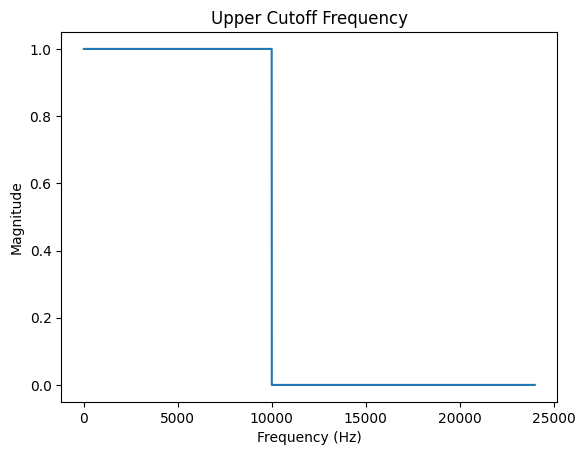

In [ ]:
f_pos = np.arange(0, fs / 2, step=fs / N)
H_pos = 1. * (f_pos <= 10000) #Use 10,000 Hz
plt.plot(f_pos, H_pos) #Plot filter graph

#Label the axes
plt.title('Upper Cutoff Frequency')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')

Define transfer function $H(f)$ at negative frequencies $f < 0$.

Text(0, 0.5, 'Magnitude')

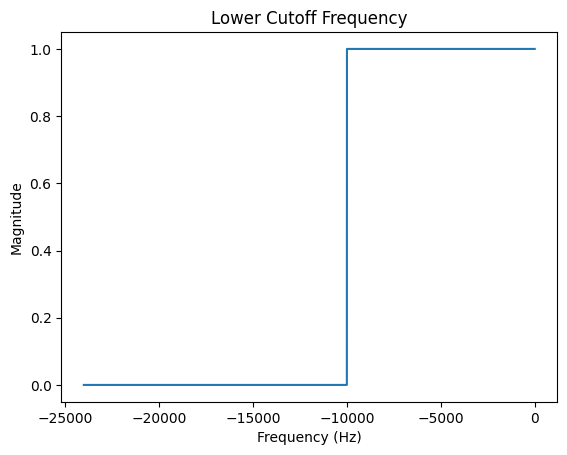

In [ ]:
f_neg = np.arange(-fs / 2, 0, step=fs / N)
H_neg = 1. * (f_neg >= -10000) #Use -10,000 Hz
plt.plot(f_neg, H_neg) #Plot filter graph

#Label the axes
plt.title('Lower Cutoff Frequency')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')

### Calculate Cutoff Frequency at the Positive and Negative Frequencies

Text(0, 0.5, 'Magnitude')

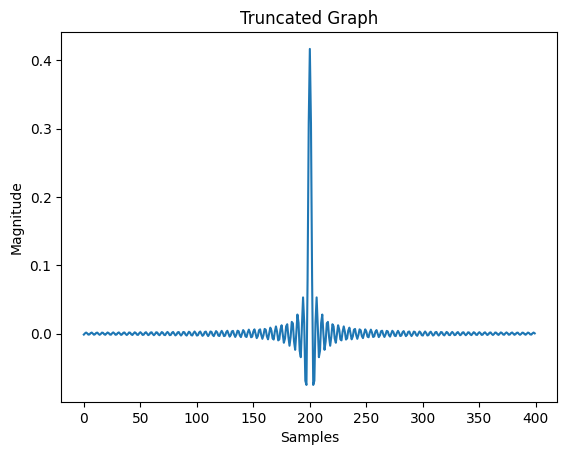

In [ ]:
H = np.concatenate([H_pos, H_neg]) #Combine cutoff frequencies

h = np.real(np.fft.ifft(H)) #Make sure the IFFT is real-valued

h_trunc = np.concatenate([h[-200:], h[:200]]) #Truncate the impulse response for the first 200 positive and negative samples

plt.plot(h_trunc) #Plot graph

#Label the axes
plt.title('Truncated Graph')
plt.xlabel('Samples')
plt.ylabel('Magnitude')

### Apply the Filter

Text(0, 0.5, 'Magnitude')

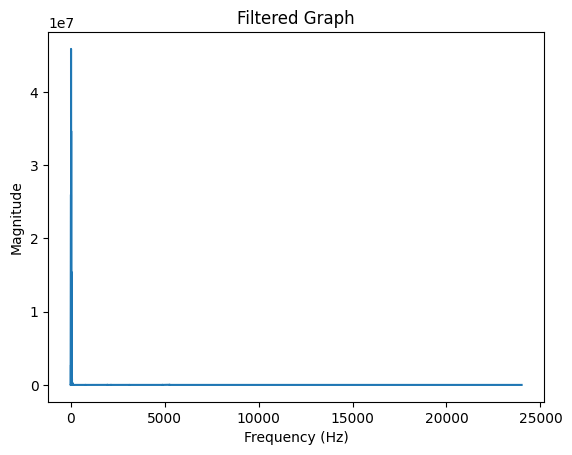

In [ ]:
y = np.convolve(x[:, 0], h_trunc) #Convolve the impulse response

N = len(y)
t = np.arange(0, N / fs, step=1 / fs) #Create time scale for graph
f_pos = np.arange(0, fs / 2, step=fs / N) #Determine frequencies

#Calculate the FFT
Y = np.fft.fft(y)
Y_pow = np.abs(Y) ** 2

plt.plot(f_pos, Y_pow[:(N // 2+1)]) #Plot Graph

#Label the axes
plt.title('Filtered Graph')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')

### Listen to the New Audio File

In [ ]:
Audio(y, rate=fs) #Play audio at sampling frequency

Despite making logical sense that cutting off the frequencies according to the graph would remove noise, the audio still sounds the same. Therefore, the Butterworth filter is then applied. The graphs also appear the same as seen below.

Text(0, 0.5, 'Magnitude')

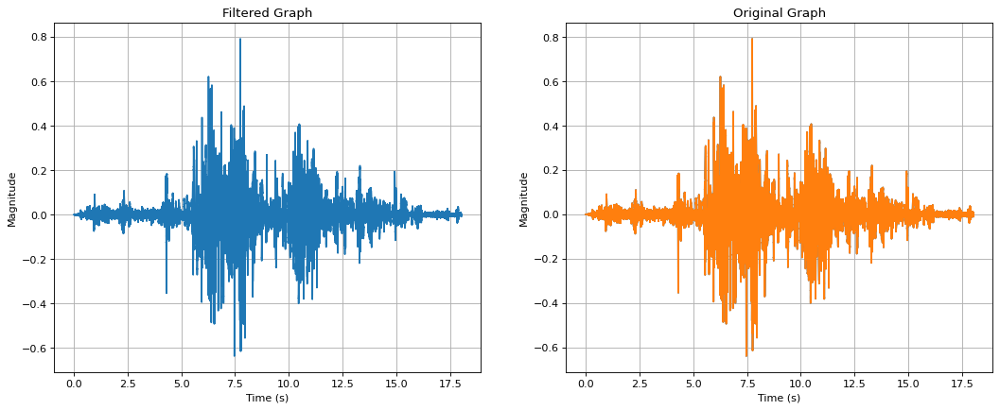

In [ ]:
plt.figure(figsize=(16, 6), dpi=80) #Adjust graph sizes

#Plot graph
plt.subplot(1, 2, 1)
plt.plot(t, y)
plt.grid(True)

#Label the axes
plt.title('Filtered Graph')
plt.xlabel('Time (s)')
plt.ylabel('Magnitude')

t1 = np.arange(0, duration-0.00001, step=1. / fs) #Create time scale for graph

#Plot graph
plt.subplot(1, 2, 2)
plt.plot(t1, x)
plt.grid(True)

#Label the axes
plt.title('Original Graph')
plt.xlabel('Time (s)')
plt.ylabel('Magnitude')

### Access Library for Applying Butterworth Filter

In [ ]:
from scipy.signal import lfilter, freqz, butter, firls, remez, firwin, firwin2, group_delay

### Apply the Butterworth Filter

Text(0, 0.5, 'Magnitude')

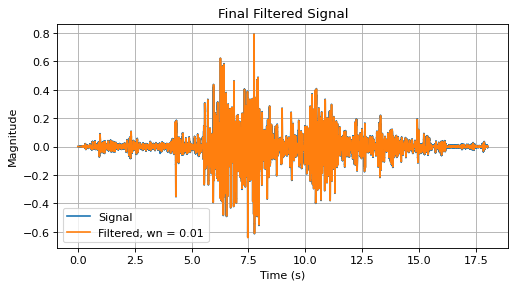

In [ ]:
#5-order lowpass butterworth filter

wn = 0.01 #Nyquist value

#Calculate IIR filter
b, a = butter(5, wn)
z = lfilter(b, a, y) #Store result

#Plot Filtered Signal with Unfiltered Signal
plt.figure(figsize=(16, 8), dpi=80)
plt.subplot(2, 2, 1)
plt.plot(t, y, 'C0')
plt.plot(t, z, 'C1')
plt.grid(True)
plt.legend(('Signal', 'Filtered, wn = {}'.format(wn)), loc='lower left')

#Label the axes
plt.title('Final Filtered Signal')
plt.xlabel('Time (s)')
plt.ylabel('Magnitude')

### Plot Filtered Signal Against NASA Filtered Signal

Text(0, 0.5, 'Magnitude')

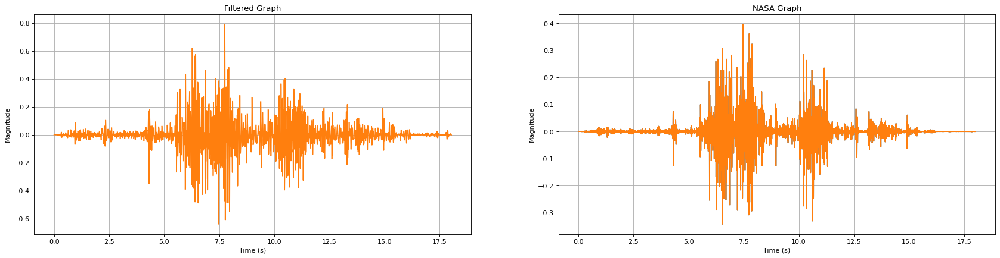

In [ ]:
#For NASA audio
nasa, fs = sf.read('/content/drive/MyDrive/Colab Notebooks/dsp/CW/Sounds-of-Mars_first-sounds-filtered.wav') #Acquire audio and its frequency from google drive
duration = librosa.get_duration(path='/content/drive/MyDrive/Colab Notebooks/dsp/CW/Sounds-of-Mars_first-sounds-filtered.wav') #Acquire the audio duration

plt.figure(figsize=(26, 6), dpi=80) #Adjust graph sizes

#Plot graph
plt.subplot(1, 2, 1)
plt.plot(t, z, 'C1')
plt.grid(True)

#Label the axes
plt.title('Filtered Graph')
plt.xlabel('Time (s)')
plt.ylabel('Magnitude')

t2 = np.arange(0, duration-0.00001, step=1. / fs) #Create time scale for graph

#Plot graph
plt.subplot(1, 2, 2)
plt.plot(t2, nasa)
plt.grid(True)

#Label the axes
plt.title('NASA Graph')
plt.xlabel('Time (s)')
plt.ylabel('Magnitude')

### Listen to the Nasa Filtered Audio File

In [ ]:
Audio(nasa.T, rate=fs) #Play audio at sampling frequency

### Listen to the Final Audio File

In [ ]:
Audio(z, rate=fs) #Play audio at sampling frequency